# T/NK Cell BBKNN Parameter Testing

**Objective**: Test different BBKNN parameters to reduce over-clustering

**Test Parameters**:
- `neighbors_within_batch`: 3, 4, 5
- `trim`: 30, 40, None (auto)
- `resolution`: 2.0, 2.5, 3.0, 3.5

**Fixed Parameters**:
- UMAP: `min_dist=0.3`, `n_neighbors=30` (unchanged)
- Batch key: `['dataset', 'sample']`
- Confounder: `['tissue']`

In [1]:
import scanpy as sc
import bbknn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=80, facecolor='white')
plt.rcParams['figure.figsize'] = (6, 5)

print(f"scanpy: {sc.__version__}")
print(f"bbknn: {bbknn.__version__}")

scanpy: 1.9.8
bbknn: 1.6.0


/home/h2048/miniconda3/envs/bbknn_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Configuration
INPUT_H5AD = "/home/h2048/data/py/1128/bbknn_celltype_analysis/T/adata_T_bbknn.h5ad"
OUTPUT_DIR = "/home/h2048/data/py/1203/bbknn_param_test"

# Create output directory
output_dir = Path(OUTPUT_DIR)
output_dir.mkdir(parents=True, exist_ok=True)

print(f"Output directory: {output_dir}")

Output directory: /home/h2048/data/py/1203/bbknn_param_test


---
## 1. Load and Preprocess Data

In [3]:
# Load data
print("Loading data...")
adata = sc.read_h5ad(INPUT_H5AD)
print(f"Loaded: {adata.shape[0]:,} cells × {adata.shape[1]:,} genes")

# Check batch info
if 'dataset' in adata.obs.columns:
    n_batches = adata.obs['dataset'].nunique()
    print(f"\nBatches in 'dataset': {n_batches}")
    print(adata.obs['dataset'].value_counts())

if 'sample' in adata.obs.columns:
    n_samples = adata.obs['sample'].nunique()
    print(f"\nSamples in 'sample': {n_samples}")

if 'tissue' in adata.obs.columns:
    print(f"\nTissue types: {adata.obs['tissue'].unique()}")

Loading data...
Loaded: 45,676 cells × 34,252 genes

Batches in 'dataset': 18
dataset
Meyer_2019                   10638
Nawijn_2021                   8148
Weiqing_Wang_2022             6535
Banovich_Kropski_2020         6273
Kerstin_B_Meyer_2021          4176
Guanrui_Liao_2025             3405
Lafyatis_Rojas_2019_10Xv2     2102
Xinyu_Xie_2024                1618
Lafyatis_Rojas_2019_10Xv1      608
Tine_Wils_2024                 501
Misharin_2021                  407
Jain_Misharin_2021_10Xv2       379
Jain_Misharin_2021_10Xv1       273
Barbry_Leroy_2020              246
Ji_Hoon_Ahn_2021               139
Ordovas_Montanes_2018          103
Jennifer_P_Wang_2021            97
Misharin_Budinger_2018          28
Name: count, dtype: int64

Samples in 'sample': 112

Tissue types: ['nose', 'sinus', 'lung parenchyma', 'respiratory airway']
Categories (4, object): ['lung parenchyma', 'nose', 'respiratory airway', 'sinus']


In [5]:
# Basic preprocessing (if not already done)
print("\nPreprocessing...")

# Store raw counts if available
if adata.raw is None and 'counts' in adata.layers:
    adata.raw = adata.copy()
elif adata.raw is None:
    print("Warning: No raw counts found, using current .X")
    adata.raw = adata.copy()

# Filter genes (minimum cells)
sc.pp.filter_genes(adata, min_cells=3)
print(f"After filtering: {adata.shape[1]:,} genes")

# Normalize and log-transform
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Select HVGs
sc.pp.highly_variable_genes(adata, n_top_genes=4000, flavor='seurat_v3')
n_hvg = adata.var['highly_variable'].sum()
print(f"Selected HVGs: {n_hvg:,}")

# Create HVG subset
adata_hvg = adata[:, adata.var['highly_variable']].copy()

# Scale and PCA
sc.pp.scale(adata_hvg, max_value=10)
sc.tl.pca(adata_hvg, n_comps=50)  # ✅ 改tl

print("✓ Preprocessing complete")


Preprocessing...
After filtering: 34,252 genes
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
Selected HVGs: 4,000
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:38)
✓ Preprocessing complete


---
## 2. Test Ridge Regression (Optional)

Test if ridge regression improves batch correction

In [6]:
if 1:
    print("Testing ridge regression preprocessing...")
    adata_ridge = adata_hvg.copy()
    
    try:
        # 先检查列是否存在
        if 'sample' not in adata_ridge.obs.columns:
            print("Warning: 'sample' column not found, using only 'dataset'")
            batch_keys = ['dataset']
        else:
            batch_keys = ['dataset', 'sample']
        
        if 'tissue' not in adata_ridge.obs.columns:
            print("Warning: 'tissue' column not found, skipping confounder")
            confounder_keys = []
        else:
            confounder_keys = ['tissue']
        
        bbknn.ridge_regression(
            adata_ridge, 
            batch_key=batch_keys,
            confounder_key=confounder_keys
        )
        print("✓ Ridge regression completed")
        
        sc.tl.pca(adata_ridge, n_comps=50)  # ✅ 改tl
        
    except Exception as e:
        print(f"✗ Ridge regression failed: {e}")
        adata_ridge = None

Testing ridge regression preprocessing...
computing ridge regression
	finished (0:02:48)
✓ Ridge regression completed
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:48)


---
## 3. BBKNN Parameter Testing

Test multiple parameter combinations

In [7]:
# Define parameter grid
test_params = [
    # Format: (name, neighbors_within_batch, trim, description)
    ('current', 5, None, 'Current parameters (baseline)'),
    ('tight_30', 3, 30, 'Tight: n=3, trim=30'),
    ('tight_40', 3, 40, 'Tight: n=3, trim=40'),
    ('moderate', 4, 35, 'Moderate: n=4, trim=35'),
]

resolutions = [2.0, 2.5, 3.0, 3.5]

print(f"Testing {len(test_params)} BBKNN configurations × {len(resolutions)} resolutions")
print(f"Total: {len(test_params) * len(resolutions)} conditions\n")

Testing 4 BBKNN configurations × 4 resolutions
Total: 16 conditions



In [8]:
# Run BBKNN tests
results = {}

for param_name, n_neighbors, trim, desc in test_params:
    print(f"\n{'='*60}")
    print(f"Testing: {param_name}")
    print(f"Description: {desc}")
    print(f"Parameters: neighbors={n_neighbors}, trim={trim}")
    print('='*60)
    
    # Create copy for testing
    adata_test = adata_hvg.copy()
    
    # Run BBKNN
    bbknn.bbknn(
        adata_test,
        batch_key='dataset',  # ✅ 改为字符串
        neighbors_within_batch=n_neighbors,
        n_pcs=50,
        trim=trim,
        metric='correlation'
    )
    print("✓ BBKNN completed")
    
    # UMAP (keep original parameters)
    sc.tl.umap(adata_test, min_dist=0.3, n_components=2)
    print("✓ UMAP completed")
    
    # Test multiple resolutions
    for res in resolutions:
        sc.tl.leiden(adata_test, resolution=res, key_added=f'leiden_{param_name}_res{res}')
        n_clusters = adata_test.obs[f'leiden_{param_name}_res{res}'].nunique()
        print(f"  Resolution {res}: {n_clusters} clusters")
    
    # Store result
    results[param_name] = adata_test
    
print("\n✓ All BBKNN tests completed")


Testing: current
Description: Current parameters (baseline)
Parameters: neighbors=5, trim=None
computing batch balanced neighbors
	finished (0:00:57)
✓ BBKNN completed
computing UMAP
    finished (0:02:02)
✓ UMAP completed
running Leiden clustering
    finished (0:01:42)
  Resolution 2.0: 19 clusters
running Leiden clustering
    finished (0:02:16)
  Resolution 2.5: 24 clusters
running Leiden clustering
    finished (0:02:04)
  Resolution 3.0: 28 clusters
running Leiden clustering
    finished (0:02:56)
  Resolution 3.5: 36 clusters

Testing: tight_30
Description: Tight: n=3, trim=30
Parameters: neighbors=3, trim=30
computing batch balanced neighbors
	finished (0:00:41)
✓ BBKNN completed
computing UMAP
    finished (0:00:52)
✓ UMAP completed
running Leiden clustering
    finished (0:00:22)
  Resolution 2.0: 29 clusters
running Leiden clustering
    finished (0:00:29)
  Resolution 2.5: 36 clusters
running Leiden clustering
    finished (0:00:27)
  Resolution 3.0: 40 clusters
running Le

---
## 4. Quick Visual Comparison

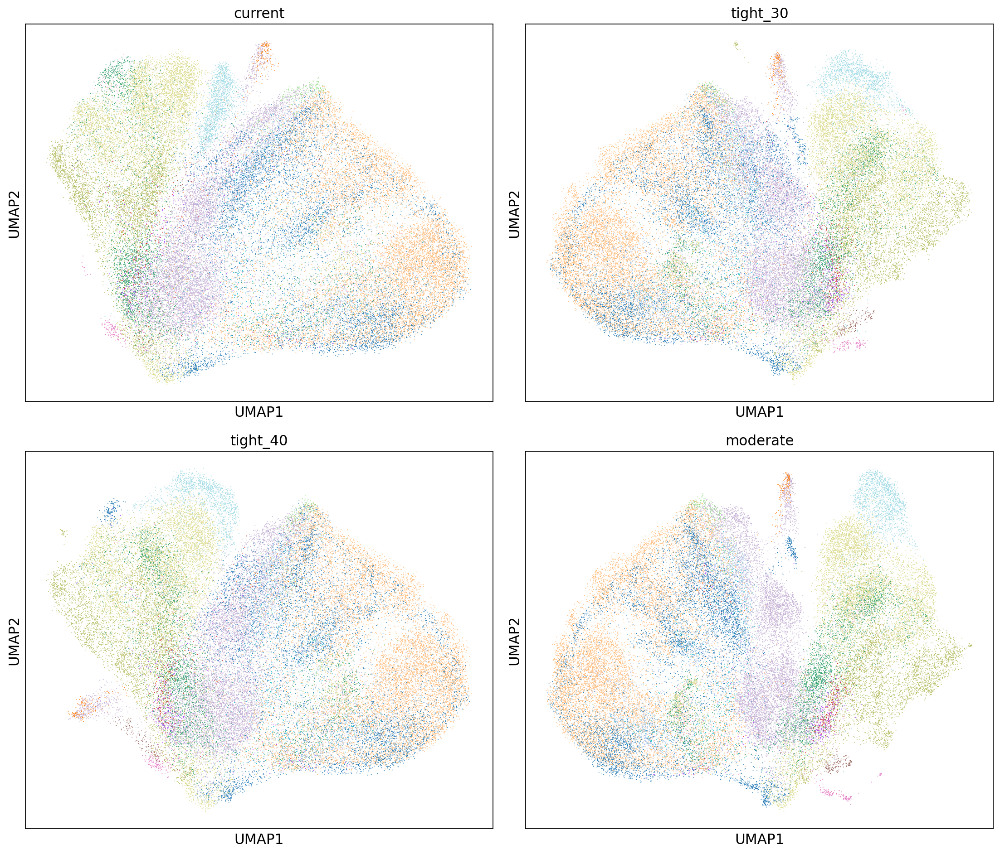

✓ Batch mixing comparison saved


In [9]:
# Compare UMAP by dataset (batch mixing)
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, (param_name, adata_test) in enumerate(results.items()):
    sc.pl.umap(adata_test, color='dataset', ax=axes[idx], 
               title=f'{param_name}', show=False, legend_loc='none')

plt.tight_layout()
plt.savefig(output_dir / 'comparison_by_batch.pdf', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Batch mixing comparison saved")

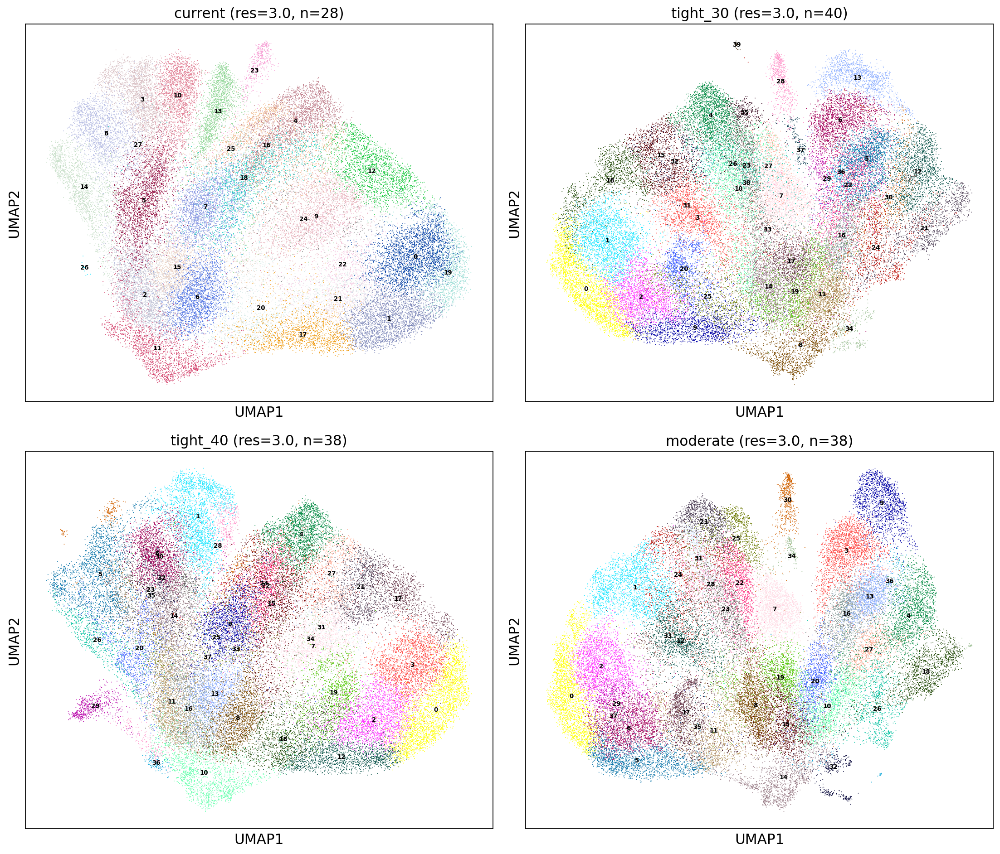

✓ Clustering comparison (res=3.0) saved


In [10]:
# Compare clustering at resolution=3.0
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

test_res = 3.0

for idx, (param_name, adata_test) in enumerate(results.items()):
    cluster_key = f'leiden_{param_name}_res{test_res}'
    n_clusters = adata_test.obs[cluster_key].nunique()
    
    sc.pl.umap(adata_test, color=cluster_key, ax=axes[idx],
               title=f'{param_name} (res={test_res}, n={n_clusters})',
               show=False, legend_loc='on data', legend_fontsize=6)

plt.tight_layout()
plt.savefig(output_dir / f'comparison_clustering_res{test_res}.pdf', dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Clustering comparison (res={test_res}) saved")

---
## 5. Quantitative Metrics

In [11]:
# Calculate batch mixing entropy for each condition
from scipy.stats import entropy

def calculate_batch_mixing_score(adata, batch_key='dataset'):
    """Calculate average batch mixing entropy across all cells"""
    from sklearn.neighbors import NearestNeighbors
    
    # Get 50 nearest neighbors for each cell
    knn = NearestNeighbors(n_neighbors=50)
    knn.fit(adata.obsm['X_pca'])
    _, indices = knn.kneighbors(adata.obsm['X_pca'])
    
    # Calculate entropy for each cell
    entropies = []
    for idx in indices:
        batch_dist = adata.obs[batch_key].iloc[idx].value_counts(normalize=True)
        entropies.append(entropy(batch_dist))
    
    return np.mean(entropies), np.std(entropies)

# Compute metrics
metrics_summary = []

for param_name, adata_test in results.items():
    mean_entropy, std_entropy = calculate_batch_mixing_score(adata_test)
    
    for res in resolutions:
        cluster_key = f'leiden_{param_name}_res{res}'
        n_clusters = adata_test.obs[cluster_key].nunique()
        
        metrics_summary.append({
            'config': param_name,
            'resolution': res,
            'n_clusters': n_clusters,
            'batch_mixing_entropy': mean_entropy,
            'entropy_std': std_entropy
        })

metrics_df = pd.DataFrame(metrics_summary)
print("\nQuantitative Metrics:")
print(metrics_df.to_string(index=False))

# Save metrics
metrics_df.to_csv(output_dir / 'bbknn_param_metrics.csv', index=False)
print(f"\n✓ Metrics saved to: {output_dir / 'bbknn_param_metrics.csv'}")


Quantitative Metrics:
  config  resolution  n_clusters  batch_mixing_entropy  entropy_std
 current         2.0          19              0.155224     0.300655
 current         2.5          24              0.155224     0.300655
 current         3.0          28              0.155224     0.300655
 current         3.5          36              0.155224     0.300655
tight_30         2.0          29              0.155224     0.300655
tight_30         2.5          36              0.155224     0.300655
tight_30         3.0          40              0.155224     0.300655
tight_30         3.5          53              0.155224     0.300655
tight_40         2.0          25              0.155224     0.300655
tight_40         2.5          31              0.155224     0.300655
tight_40         3.0          38              0.155224     0.300655
tight_40         3.5          48              0.155224     0.300655
moderate         2.0          28              0.155224     0.300655
moderate         2.5     

---
## 6. Marker Gene Check (NK, CD4, CD8)

Visualize key markers to assess biological separation

Available markers: ['NCAM1', 'NKG7', 'GNLY', 'KLRD1', 'CD4', 'IL7R', 'FOXP3', 'CD8A', 'CD8B', 'GZMB']


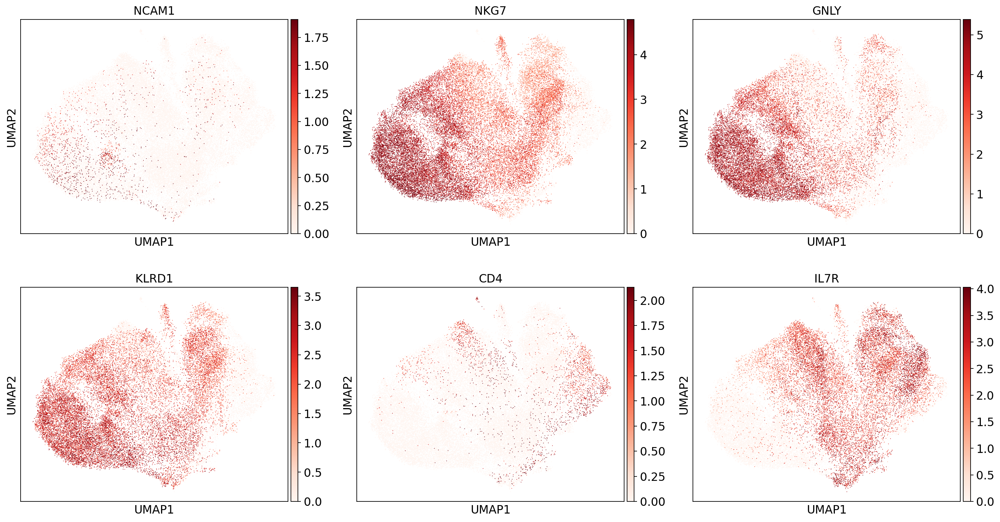

In [12]:
# Define key markers
key_markers = {
    'NK': ['NCAM1', 'NKG7', 'GNLY', 'KLRD1'],
    'CD4': ['CD4', 'IL7R', 'FOXP3'],
    'CD8': ['CD8A', 'CD8B', 'GZMB']
}

# Check which markers are available
all_markers = []
for markers in key_markers.values():
    all_markers.extend(markers)

# Get one test result for marker checking
adata_check = results['tight_30']

available_markers = [m for m in all_markers if m in adata_check.raw.var_names]
print(f"Available markers: {available_markers}")

if len(available_markers) >= 4:
    # Plot first 6 markers
    sc.pl.umap(adata_check, color=available_markers[:6], 
               use_raw=True, ncols=3, vmax='p99', cmap='Reds')
else:
    print("Not enough markers found for visualization")

---
## 7. Summary and Recommendations

In [13]:
print("\n" + "="*70)
print("BBKNN PARAMETER TEST SUMMARY")
print("="*70)

print("\n[ Tested Configurations ]")
for param_name, n_neighbors, trim, desc in test_params:
    print(f"  {param_name}: {desc}")
    print(f"    → neighbors={n_neighbors}, trim={trim}")

print(f"\n[ Resolution Range ]")
print(f"  Tested: {resolutions}")

print("\n[ Key Findings ]")
print("\nBatch Mixing (Higher = Better Mixing):")
for config in metrics_df['config'].unique():
    config_data = metrics_df[metrics_df['config'] == config].iloc[0]
    print(f"  {config}: {config_data['batch_mixing_entropy']:.3f} ± {config_data['entropy_std']:.3f}")

print("\nCluster Numbers (at res=3.0):")
res_subset = metrics_df[metrics_df['resolution'] == 3.0]
for _, row in res_subset.iterrows():
    print(f"  {row['config']}: {row['n_clusters']} clusters")

print("\n[ Next Steps ]")
print("  1. Visually inspect UMAP plots to assess:")
print("     - Are NK/CD4/CD8 cells well separated?")
print("     - Is batch mixing appropriate (not over-corrected)?")
print("     - Do clusters look biologically meaningful?")
print("  2. Check marker gene expression patterns")
print("  3. Select best configuration and run full analysis")

print("\n[ Output Files ]")
print(f"  Metrics: {output_dir / 'bbknn_param_metrics.csv'}")
print(f"  Figures: {output_dir / '*.pdf'}")

print("\n" + "="*70)


BBKNN PARAMETER TEST SUMMARY

[ Tested Configurations ]
  current: Current parameters (baseline)
    → neighbors=5, trim=None
  tight_30: Tight: n=3, trim=30
    → neighbors=3, trim=30
  tight_40: Tight: n=3, trim=40
    → neighbors=3, trim=40
  moderate: Moderate: n=4, trim=35
    → neighbors=4, trim=35

[ Resolution Range ]
  Tested: [2.0, 2.5, 3.0, 3.5]

[ Key Findings ]

Batch Mixing (Higher = Better Mixing):
  current: 0.155 ± 0.301
  tight_30: 0.155 ± 0.301
  tight_40: 0.155 ± 0.301
  moderate: 0.155 ± 0.301

Cluster Numbers (at res=3.0):
  current: 28 clusters
  tight_30: 40 clusters
  tight_40: 38 clusters
  moderate: 38 clusters

[ Next Steps ]
  1. Visually inspect UMAP plots to assess:
     - Are NK/CD4/CD8 cells well separated?
     - Is batch mixing appropriate (not over-corrected)?
     - Do clusters look biologically meaningful?
  2. Check marker gene expression patterns
  3. Select best configuration and run full analysis

[ Output Files ]
  Metrics: /home/h2048/data/p

---
## 8. Save Selected Result (Optional)

Once you identify the best configuration, uncomment and run:

In [14]:
# # Select best configuration
# BEST_CONFIG = 'tight_30'  # Change to your preferred config
# BEST_RES = 3.0

# adata_best = results[BEST_CONFIG].copy()
# adata_best.obs['leiden'] = adata_best.obs[f'leiden_{BEST_CONFIG}_res{BEST_RES}']

# # Save
# output_file = output_dir / f'adata_tcell_bbknn_optimized_{BEST_CONFIG}.h5ad'
# adata_best.write_h5ad(output_file)
# print(f"✓ Saved optimized result to: {output_file}")